# Augment assessment with better gold standard data

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
from collections.abc import Sequence
import windowCNV as wcnv

warnings.simplefilter("ignore")

sc.settings.set_figure_params(figsize=(5, 5))

/opt/anaconda3/envs/windowcnv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


The dataset used is the same as Sample 1 in HW2. It contains:

- 10k PBMCs from a Healthy Donor (v3 chemistry) Single Cell Gene Expression Dataset by Cell Ranger 3.0.0
- Peripheral blood mononuclear cells (PBMCs) from a healthy donor (the same cells were used to generate pbmc_1k_v2, pbmc_10k_v3). PBMCs are primary cells with relatively small amounts of RNA (~1pg RNA/cell).
- 11,769 cells detected by CellRanger
Sequenced on Illumina NovaSeq with approximately 54,000 reads per cell

## Loading the example dataset and Pre-processing

In [2]:
adata = sc.read_10x_h5('/users/carolli/Desktop/CSCB/Final/pbmc_10k_v3_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

In [3]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
adata.var['ribo'] = adata.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

In [4]:
# keep cells with fewer than 20% mitochondrially encoded gene total UMIs
adata = adata[adata.obs['pct_counts_mt']<20,:].copy()

# filter based on total number of genes detected (at least 500).
sc.pp.filter_cells(adata, min_genes=500)
# filter based on total number of counts (fewer than than 30,000).
sc.pp.filter_cells(adata, max_counts=30000)
# keep genes that are detected in at least 3 cells.
sc.pp.filter_genes(adata, min_cells=3)

In [5]:
# Save raw counts
adata.raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

In [6]:
# Normalize and log-transform
sc.pp.normalize_total(adata , target_sum=1e4)
sc.pp.log1p(adata)
adata.layers['lognorm'] = adata.X.copy()

In [7]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=6, min_disp=0.25)

In [8]:
sc.tl.pca(adata , mask_var='highly_variable')

n_neighbors = 20
n_pcs = 10
# Compute the k-nearest neighbor graph using specified number of neighbors and principal components
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Perform Leiden clustering with the specified resolution
sc.tl.leiden(adata, .1)

# Compute the PAGA for trajectory inference
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)

# Compute the UMAP for 2D visualization using PAGA initialization
sc.tl.umap(adata, 0.25, init_pos='paga')

## Cell type annotation

In [9]:
marker_genes_broad_dict = {
    'B cell': ['CD19', 'CD79A', 'CD79B', 'PAX5'],
    'Dendritic': ['FLT3', 'CLEC4C', 'FCER1A'],
    'Monocyte': ['CD14', 'CD68', 'LYZ', 'CSF1R', 'FCGR3A'],
    'NK cell': ['NCAM1', 'NKG7', 'GNLY'],
    'T cell': ['CD3D', 'TRAC', 'CD3E'],
}

In [10]:
sc.tl.leiden(adata,.05, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adata, "leiden_R")
sc.tl.leiden(adata,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adata, "leiden_R")

# Define the list of clusters to retain in the filtered dataset
tokeep = ["1", "4,0", "3", "6", "7", "0", "2,0", "2,1"]

# Filter the dataset to retain only the cells belonging to the specified clusters
adata = adata[adata.obs['leiden_R'].isin(tokeep)].copy()

# Define a dictionary mapping cell types to their corresponding clusters
cell_dict = {
    'Dendritic': ['6'],
    'CD14 Monocyte': ['1'],
    'CD16 Monocyte': ["4,0"],
    'B cell': ['3'],
    'Platelet': ['7'],
    'CD4 T cell': ['0'],
    'CD8 T cell': ["2,0"],
    'NK cell': ["2,1"]
}

# Create a new column in the observation metadata to store cell type annotations
new_obs_name = 'cell_type'
adata.obs[new_obs_name] = np.nan

# Assign cell type annotations based on the cluster assignments in `cell_dict`
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden_R).isin(cell_dict[i])
    adata.obs.loc[ind, new_obs_name] = i

# Convert the 'cell_type' column to a categorical data type for efficient storage and analysis
adata.obs['cell_type'] = adata.obs['cell_type'].astype("category")

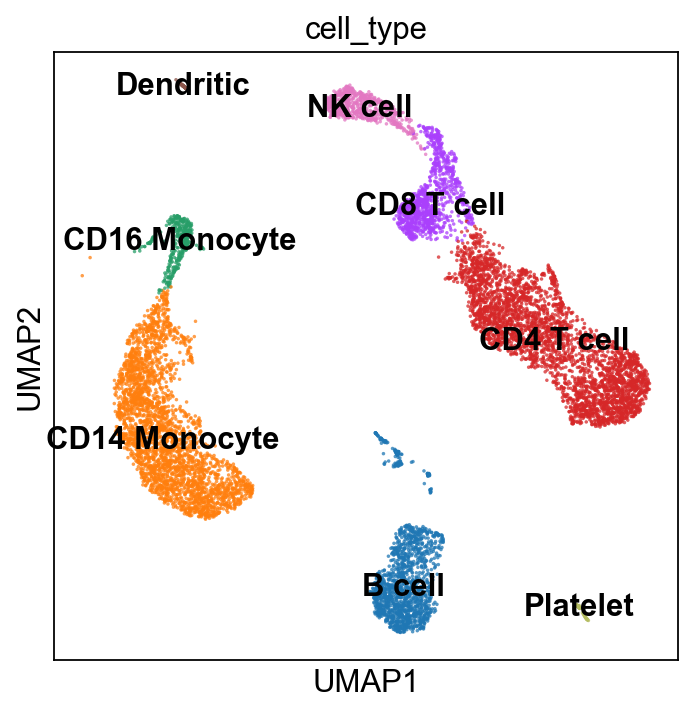

In [11]:
sc.pl.umap(adata,color=['cell_type'], alpha=.75, s=10, legend_loc='on data')

In [12]:
# Subset and reassign .raw
adata = adata[adata.obs['cell_type'] != 'Platelet'].copy()
adata.raw = adata.raw.to_adata()[adata.obs_names, :].copy()

In [13]:
annotation = '/users/carolli/Desktop/CSCB/Final/mart_export_GRCh38.p14.txt'

In [14]:
adata = wcnv.annotate_adata_with_chromosomes(adata, annotation)

In [15]:
adata_save = adata.copy()

In [16]:
adata_save

AnnData object with n_obs × n_vars = 10373 × 14950
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts', 'leiden', 'leiden_R', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'start', 'end'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_R', 'dendrogram_leiden_R', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'lognorm'
    obsp: 'distances', 'connectivities'

## CNV simulation

In [17]:
celltype_cna_counts = {
    'B cell': 8,
    'CD4 T cell': 5,
    'CD8 T cell': 5,
    'NK cell': 6,
    'CD14 Monocyte': 2,
    'CD16 Monocyte': 2,
    'Dendritic': 2
}

In [18]:
adata = wcnv.simulate_cnas_by_celltype(adata, celltype_col='cell_type', celltype_cna_counts=celltype_cna_counts)


[Simulated CNV Summary]
     cell_type chromosome  CN  num_events  avg_size_bp
0       B cell          1   1         486    8782233.0
1       B cell         19   4         469     561379.0
2       B cell         21   4         500   40704395.0
3       B cell          3   0         488     997978.0
4       B cell          9   1         492    6442748.0
5       B cell          X   4         480     609515.0
6       B cell          Y   1         465    9644360.0
7   CD4 T cell         17   4        1109    6869209.0
8   CD4 T cell         21   1        1079     557171.0
9   CD4 T cell         22   0        1056     815663.0
10  CD4 T cell          7   0        1097    5172732.0
11  CD8 T cell         14   4         324     666165.0
12  CD8 T cell         18   0         301    8165648.0
13  CD8 T cell         19   0         303     835271.0
14  CD8 T cell          7   4         309   48501532.0
15  CD8 T cell          X   0         303    4634486.0
16   Dendritic         10   0          2

The warning arises because, although specific CNVs were assigned to different cell types, some genes or regions were too short for simulation, causing the function to skip them and proceed to the next. I didn’t enforce the exact specified number of CNVs to prevent potential errors.

In [19]:
wcnv.summarize_cna_regions(adata)

,chromosome,start,end,length,cna_label
0,1,30708468,39490701,8782234,CN 1
1,1,129950585,173499315,43548731,CN 0
2,10,1673767,26032764,24358998,CN 4
3,10,130745037,131408465,663429,CN 0
4,14,30571844,31238009,666166,CN 4
5,17,52559916,59429125,6869210,CN 4
6,18,53225935,61391583,8165649,CN 0
7,18,56989913,66621789,9631877,CN 0
8,19,7083263,7918534,835272,CN 0
9,19,11561506,12120844,559339,CN 0


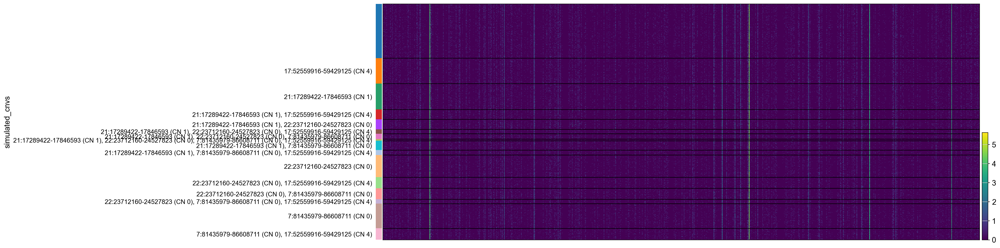

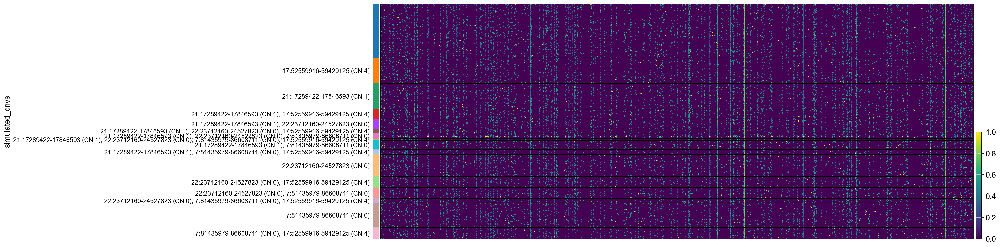

In [21]:
wcnv.plot_cna_heatmap(
    adata,
    cell_type='CD4 T cell',
    chromosome='17'
)

## Using original incercnv() from reference package

In [22]:
adata1=adata.copy()

In [23]:
# Add 'chr' only if not present
adata1.var['chromosome'] = adata1.var['chromosome'].apply(lambda x: x if str(x).startswith('chr') else f'chr{x}')

# Keep standard chromosomes chr1 - chr22 plus chrX and chrY
standard_chromosomes = [f'chr{i}' for i in range(1, 23)] + ['chrX', 'chrY']

# Filter adata to only standard chromosomes
adata1 = adata1[:, adata1.var['chromosome'].isin(standard_chromosomes)].copy()

In [24]:
cnv.tl.infercnv(
    adata1,
    reference_key="cell_type",
    window_size=250
)

100%|█████████████████████████████████████████████| 3/3 [00:04<00:00,  1.34s/it]


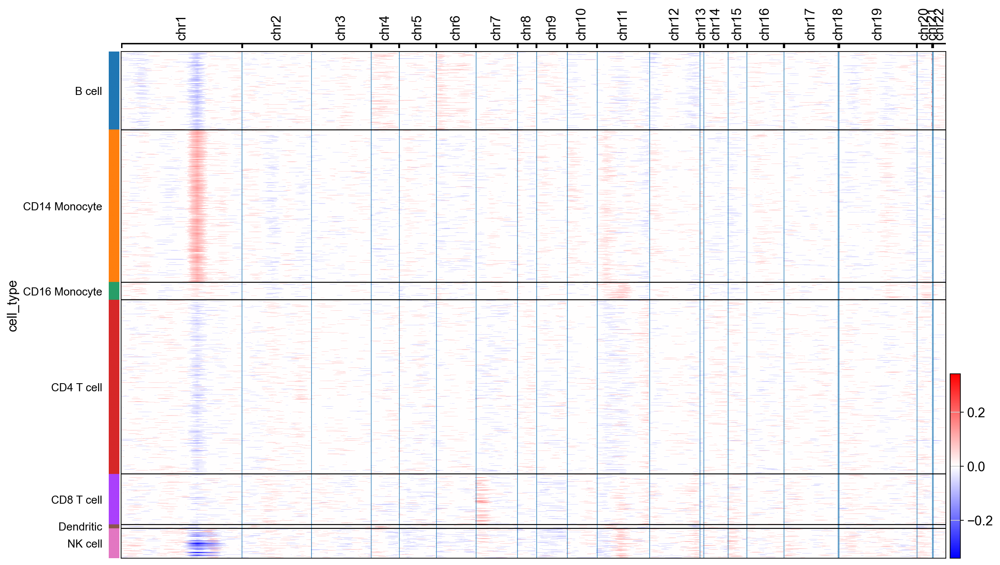

In [25]:
cnv.pl.chromosome_heatmap(adata1, groupby="cell_type")

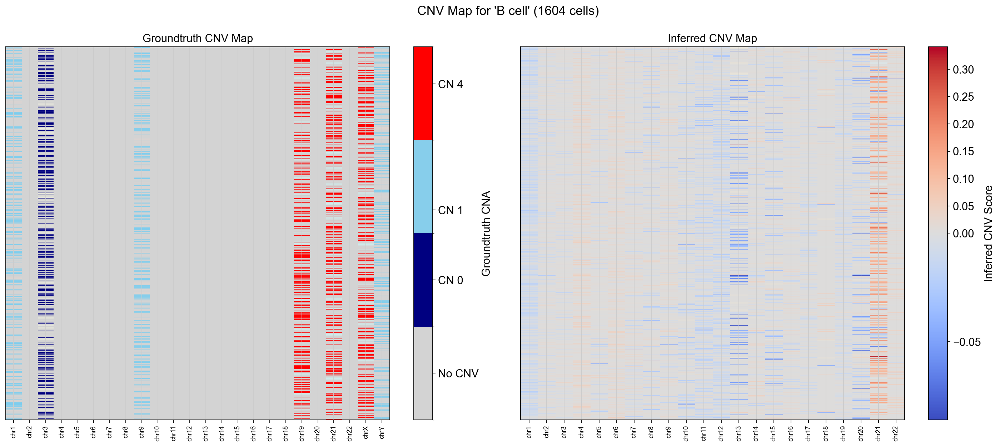

In [26]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    adata1,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

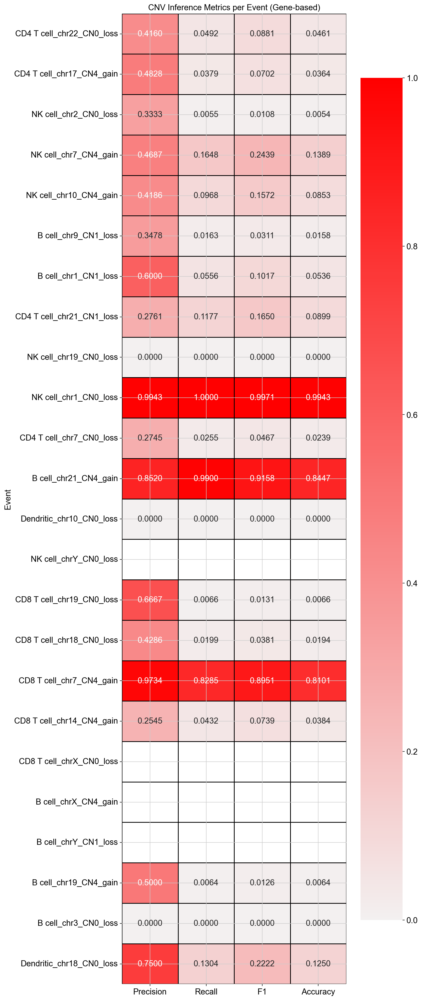

,TP,FP,FN,Precision,Recall,F1,Accuracy
Event,,,,,,,
CD4 T cell_chr22_CN0_loss,52.0,73.0,1004.0,0.416000,0.049242,0.088061,0.046058
CD4 T cell_chr17_CN4_gain,42.0,45.0,1067.0,0.482759,0.037872,0.070234,0.036395
NK cell_chr2_CN0_loss,1.0,2.0,181.0,0.333333,0.005495,0.010811,0.005435
NK cell_chr7_CN4_gain,30.0,34.0,152.0,0.468750,0.164835,0.243902,0.138889
NK cell_chr10_CN4_gain,18.0,25.0,168.0,0.418605,0.096774,0.157205,0.085308
B cell_chr9_CN1_loss,8.0,15.0,484.0,0.347826,0.016260,0.031068,0.015779
B cell_chr1_CN1_loss,27.0,18.0,459.0,0.600000,0.055556,0.101695,0.053571
CD4 T cell_chr21_CN1_loss,127.0,333.0,952.0,0.276087,0.117702,0.165042,0.089943
NK cell_chr19_CN0_loss,0.0,0.0,188.0,0.000000,0.000000,0.000000,0.000000


In [27]:
wcnv.evaluate_cnv_inference_aligned(
    adata1,
    celltype_key='cell_type',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv',
    threshold_std=1.0
)

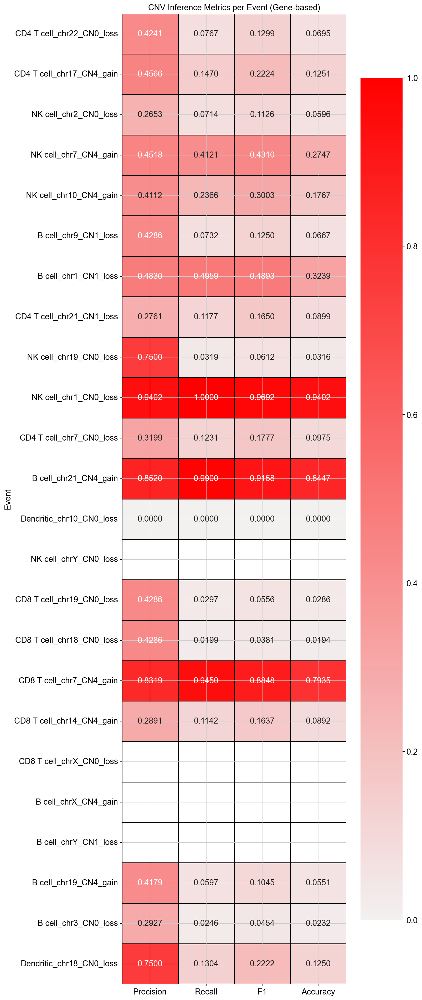

,TP,FP,FN,Precision,Recall,F1,Accuracy
Event,,,,,,,
CD4 T cell_chr22_CN0_loss,81.0,110.0,975.0,0.424084,0.076705,0.129912,0.069468
CD4 T cell_chr17_CN4_gain,163.0,194.0,946.0,0.456583,0.146979,0.222373,0.125096
NK cell_chr2_CN0_loss,13.0,36.0,169.0,0.265306,0.071429,0.112554,0.059633
NK cell_chr7_CN4_gain,75.0,91.0,107.0,0.451807,0.412088,0.431034,0.274725
NK cell_chr10_CN4_gain,44.0,63.0,142.0,0.411215,0.236559,0.300341,0.176707
B cell_chr9_CN1_loss,36.0,48.0,456.0,0.428571,0.073171,0.125000,0.066667
B cell_chr1_CN1_loss,241.0,258.0,245.0,0.482966,0.495885,0.489340,0.323925
CD4 T cell_chr21_CN1_loss,127.0,333.0,952.0,0.276087,0.117702,0.165042,0.089943
NK cell_chr19_CN0_loss,6.0,2.0,182.0,0.750000,0.031915,0.061224,0.031579


In [28]:
wcnv.evaluate_cnv_inference_aligned(
    adata1,
    celltype_key='cell_type',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv',
    threshold_std=0.5
)

Lowering the `threshold_std` from 1.0 to 0.5 in the original `infercnv()` improved overall recall and F1 scores across most CNV events. For instance, `CD4 T cell_chr17_CN4_gain` recall rose from 0.038 to 0.147, and `NK cell_chr7_CN4_gain` from 0.165 to 0.412. This indicates greater sensitivity at the lower threshold.

Although false positives also increased—causing a slight drop in precision for some events (e.g., `B cell_chr1_CN1_loss` from 0.60 to 0.48)—the overall balance between precision and recall improved, as reflected in higher F1 scores.

Between the two, a `threshold_std = 0.5` is better for applications that prioritize capturing more true CNVs, accepting some noise. In contrast, `threshold_std = 1.0` is more conservative, favoring precision over sensitivity.

## New Helper function

In [29]:
wcnv.find_reference_candidates(adata)


Top 5 lowest-variance cell types:

CD16 Monocyte: avg variance = 0.0664
Dendritic: avg variance = 0.0711
CD14 Monocyte: avg variance = 0.0770
CD4 T cell: avg variance = 0.0825
B cell: avg variance = 0.0910


['CD16 Monocyte', 'Dendritic', 'CD14 Monocyte', 'CD4 T cell', 'B cell']

Here, I choose 'CD16 Monocyte' as the reference normal cell type. I run the original infercnv() again.

In [30]:
ad_cat = adata.copy()

In [31]:
# Add 'chr' only if not present
ad_cat.var['chromosome'] = ad_cat.var['chromosome'].apply(lambda x: x if str(x).startswith('chr') else f'chr{x}')

# Keep standard chromosomes chr1 - chr22 plus chrX and chrY
standard_chromosomes = [f'chr{i}' for i in range(1, 23)] + ['chrX', 'chrY']

# Filter adata to only standard chromosomes
ad_cat = ad_cat[:, ad_cat.var['chromosome'].isin(standard_chromosomes)].copy()

In [32]:
cnv.tl.infercnv(
    ad_cat,
    reference_key="cell_type",
    reference_cat="CD16 Monocyte",
    window_size=250
)

100%|█████████████████████████████████████████████| 3/3 [00:03<00:00,  1.21s/it]


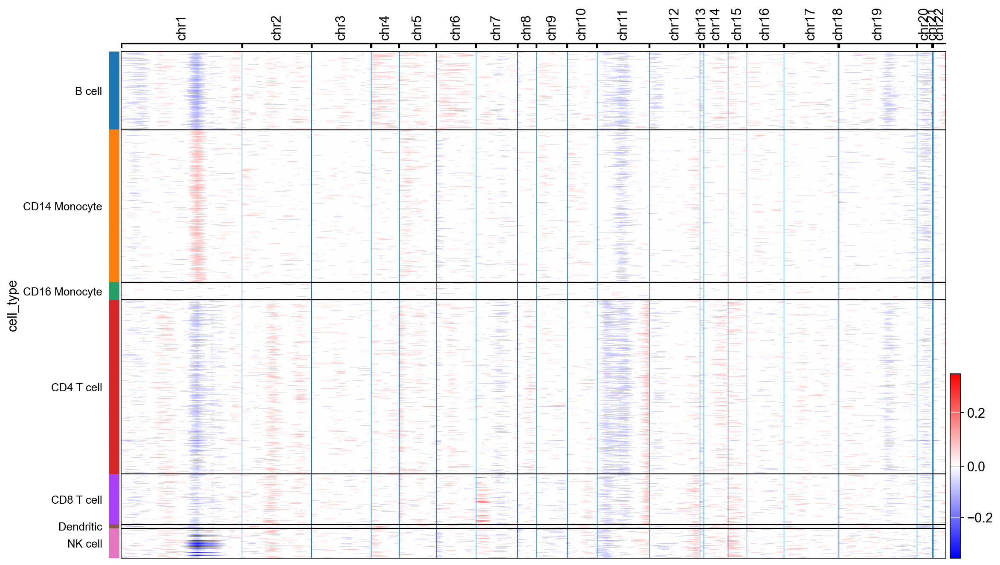

In [33]:
cnv.pl.chromosome_heatmap(ad_cat, groupby="cell_type")

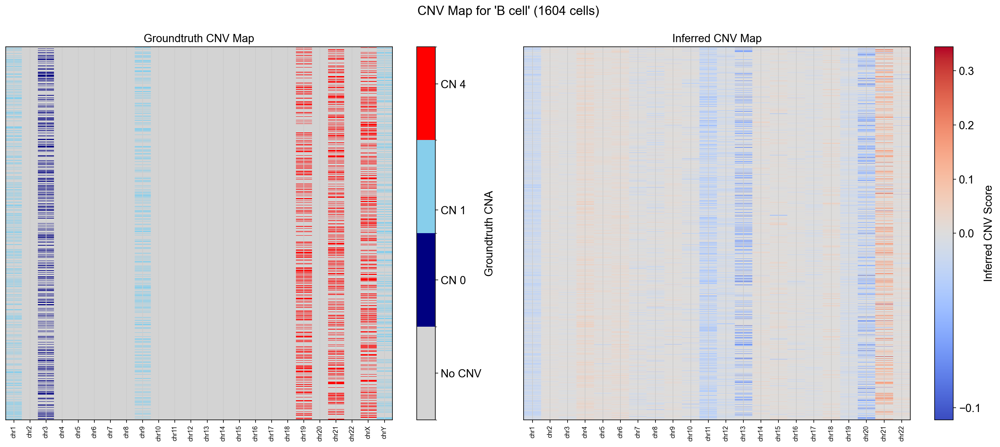

In [34]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    ad_cat,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

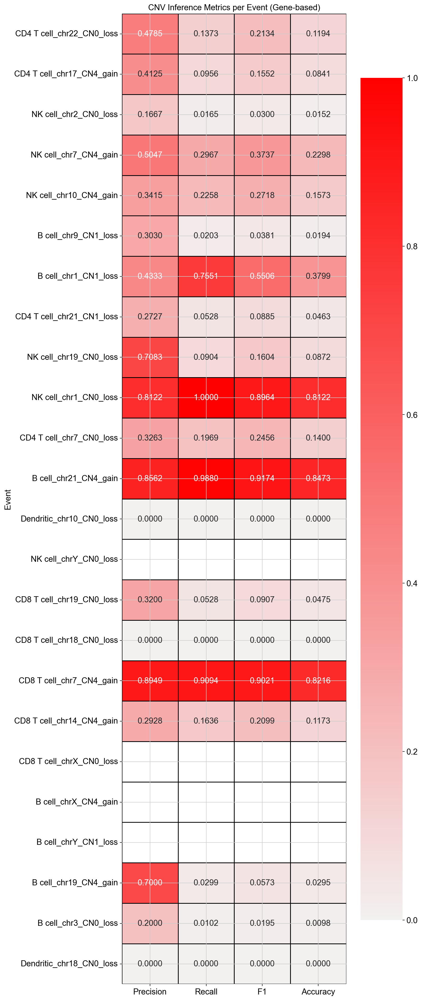

,TP,FP,FN,Precision,Recall,F1,Accuracy
Event,,,,,,,
CD4 T cell_chr22_CN0_loss,145.0,158.0,911.0,0.478548,0.137311,0.213392,0.119440
CD4 T cell_chr17_CN4_gain,106.0,151.0,1003.0,0.412451,0.095582,0.155197,0.084127
NK cell_chr2_CN0_loss,3.0,15.0,179.0,0.166667,0.016484,0.030000,0.015228
NK cell_chr7_CN4_gain,54.0,53.0,128.0,0.504673,0.296703,0.373702,0.229787
NK cell_chr10_CN4_gain,42.0,81.0,144.0,0.341463,0.225806,0.271844,0.157303
B cell_chr9_CN1_loss,10.0,23.0,482.0,0.303030,0.020325,0.038095,0.019417
B cell_chr1_CN1_loss,367.0,480.0,119.0,0.433294,0.755144,0.550637,0.379917
CD4 T cell_chr21_CN1_loss,57.0,152.0,1022.0,0.272727,0.052827,0.088509,0.046304
NK cell_chr19_CN0_loss,17.0,7.0,171.0,0.708333,0.090426,0.160377,0.087179


In [35]:
wcnv.evaluate_cnv_inference_aligned(
    ad_cat,
    celltype_key='cell_type',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv',
    threshold_std=0.5
)

Comparing the three `infercnv()` runs under different threshold settings and reference cell types reveals clear performance differences. The initial run with `threshold_std=1.0` yields high precision for a few confident CNV events but suffers from very low recall, resulting in poor F1 scores except for prominent cases like CD8 T cell gains on chromosome 7 or B cell gains on chromosome 21. Lowering the threshold to 0.5 improves recall and produces more balanced F1 scores, though it introduces additional false positives—particularly benefiting events like B cell loss on chromosome 1 and CD4 T cell gains.

The third run (as shown above), which retains `threshold_std=0.5` but uses CD16 Monocytes as the reference, delivers the best overall performance. It achieves the highest recall across cell types, improved F1 scores for both subtle and prominent CNVs, and preserves strong precision in confidently detected regions. This configuration—**`threshold_std=0.5` with CD16 Monocyte as reference**—offers the best trade-off between precision and recall and is recommended for annotation. These results validate the effectiveness of our helper function in enhancing CNV detection.

Additionally, by examining the individual performance scores for each CNV event, we observed that event frequency—how often a CNV occurs across cells—has limited influence on detection accuracy in our method. Instead, **CNV size** plays a more critical role: larger CNVs tend to yield higher precision, recall, and F1 scores. In fact, most of the top-performing events are above average in genomic length, suggesting that longer CNVs provide a stronger and more consistent signal for detection. Notably, the top four highest-scoring events across all evaluations are **CN4 (copy number gain) events**, indicating that stronger amplification signals are more readily captured by our algorithm. This aligns with our early observations, where gain events were more frequently inferred than losses, likely due to their stronger and more detectable expression shifts.

## New windowing strategy and varied `window_distance`

In [36]:
adata2 = adata.copy()

In [37]:
wcnv.infercnv(
    adata=adata2,
    reference_key="cell_type",
    reference_cat="CD16 Monocyte",
    smooth=True,
    window_distance=5e6,
    normalization_mode="reference",
    inplace=True,
    key_added="cnv"
)

Running inferCNV chunks: 100%|████████████████████| 3/3 [00:00<00:00,  4.26it/s]


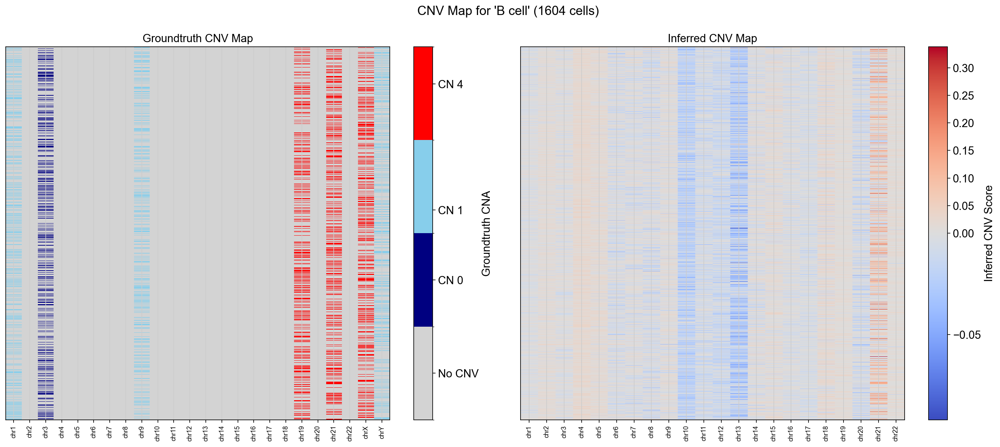

In [38]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    adata2,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

[INFO] Gain threshold: > 0.1862
[INFO] Loss threshold: < -0.1714
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


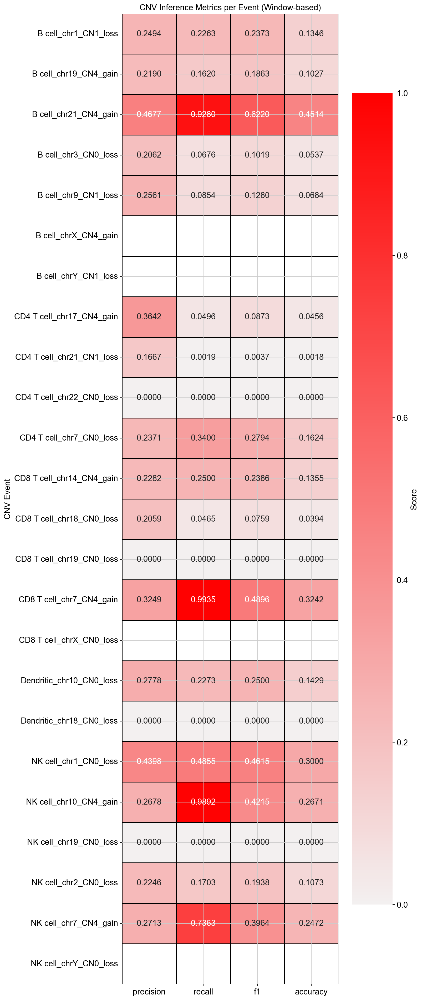

[INFO] Total predicted CNVs: 6744


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss  110.0   331.0   376.0   0.249433   
 1       B cell      chr19  4        gain   76.0   271.0   393.0   0.219020   
 2       B cell      chr21  4        gain  464.0   528.0    36.0   0.467742   
 3       B cell       chr3  0        loss   33.0   127.0   455.0   0.206250   
 4       B cell       chr9  1        loss   42.0   122.0   450.0   0.256098   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain   55.0    96.0  1054.0   0.364238   
 8   CD4 T cell      chr21  1        loss    2.0    10.0  1077.0   0.166667   
 9   CD4 T cell      chr22  0        loss    0.0     2.0  1056.0   0.000000   
 10  CD4 T cell       chr7  0        loss  373.0  1200.0   724.0   0.237127   
 11  CD8 T cell      chr14  4        gain   81.0   2

In [39]:
wcnv.evaluate_cnv_with_window(adata2, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.2513
[INFO] Loss threshold: < -0.2377
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


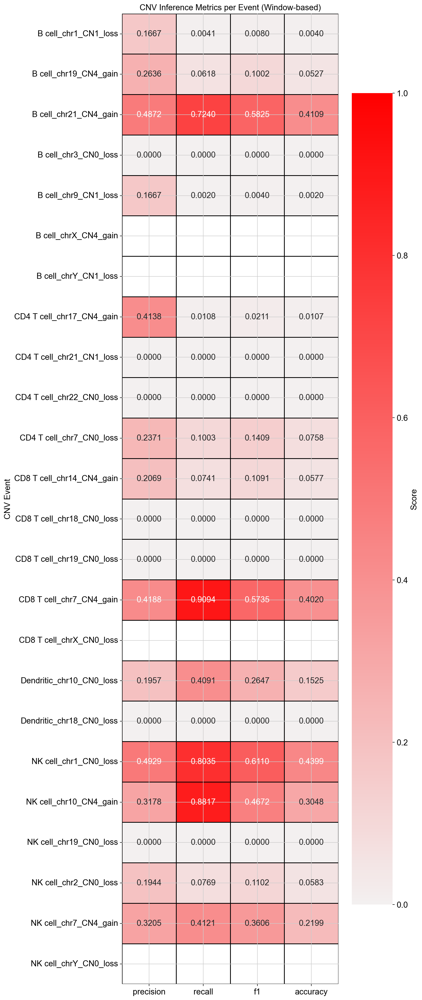

[INFO] Total predicted CNVs: 3303


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss    2.0   10.0   484.0   0.166667   
 1       B cell      chr19  4        gain   29.0   81.0   440.0   0.263636   
 2       B cell      chr21  4        gain  362.0  381.0   138.0   0.487214   
 3       B cell       chr3  0        loss    0.0    1.0   488.0   0.000000   
 4       B cell       chr9  1        loss    1.0    5.0   491.0   0.166667   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain   12.0   17.0  1097.0   0.413793   
 8   CD4 T cell      chr21  1        loss    0.0    0.0  1079.0   0.000000   
 9   CD4 T cell      chr22  0        loss    0.0    0.0  1056.0   0.000000   
 10  CD4 T cell       chr7  0        loss  110.0  354.0   987.0   0.237069   
 11  CD8 T cell      chr14  4        gain   24.0   92.0   300.0 

In [40]:
wcnv.evaluate_cnv_with_window(adata2, gain_percentile=10, loss_percentile=10)

[INFO] Gain threshold: > 0.1574
[INFO] Loss threshold: < -0.1486
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


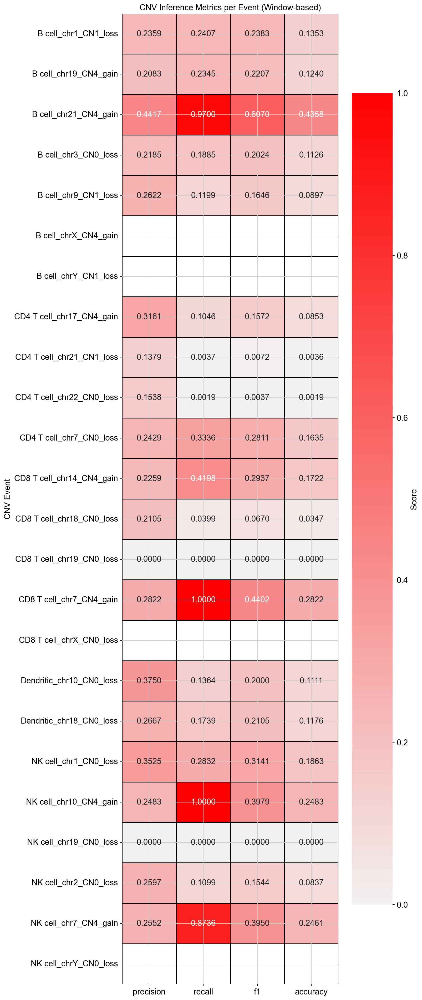

[INFO] Total predicted CNVs: 8049


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss  117.0   379.0   369.0   0.235887   
 1       B cell      chr19  4        gain  110.0   418.0   359.0   0.208333   
 2       B cell      chr21  4        gain  485.0   613.0    15.0   0.441712   
 3       B cell       chr3  0        loss   92.0   329.0   396.0   0.218527   
 4       B cell       chr9  1        loss   59.0   166.0   433.0   0.262222   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  116.0   251.0   993.0   0.316076   
 8   CD4 T cell      chr21  1        loss    4.0    25.0  1075.0   0.137931   
 9   CD4 T cell      chr22  0        loss    2.0    11.0  1054.0   0.153846   
 10  CD4 T cell       chr7  0        loss  366.0  1141.0   731.0   0.242867   
 11  CD8 T cell      chr14  4        gain  136.0   4

In [41]:
wcnv.evaluate_cnv_with_window(adata2, gain_percentile=50, loss_percentile=50)

When using the default window size, **30% appears to be a strong default choice**:

* **Compared to 10%**, the 30% threshold substantially improves **recall** and **F1 scores**, meaning you're recovering far more true CNVs while still keeping false positives in check.
* **Compared to 50%**, it avoids the overcalling problem that leads to high false positives and degraded precision, while still maintaining high enough recall for biologically relevant events.

Thus, 30% provides a good **balance**—not too strict (like 10%, which misses many CNVs), and not too lenient (like 50%, which risks flooding results with false positives).

Although the overall performance scores are still not higher than the original `infercnv()` method, our window\_distance-based algorithm achieves **relatively better scores for CN0 events**—something the original package struggled to detect. This highlights the improved ability of our new approach to **identify deletion events**, particularly **homogeneous losses**, which were previously underrepresented.

In [42]:
adata3 = adata.copy()

In [43]:
wcnv.infercnv(
    adata=adata3,
    reference_key="cell_type",
    reference_cat="CD16 Monocyte",
    smooth=True,
    window_distance=1e6,
    normalization_mode="reference",
    inplace=True,
    key_added="cnv"
)

Running inferCNV chunks: 100%|████████████████████| 3/3 [00:00<00:00,  3.35it/s]


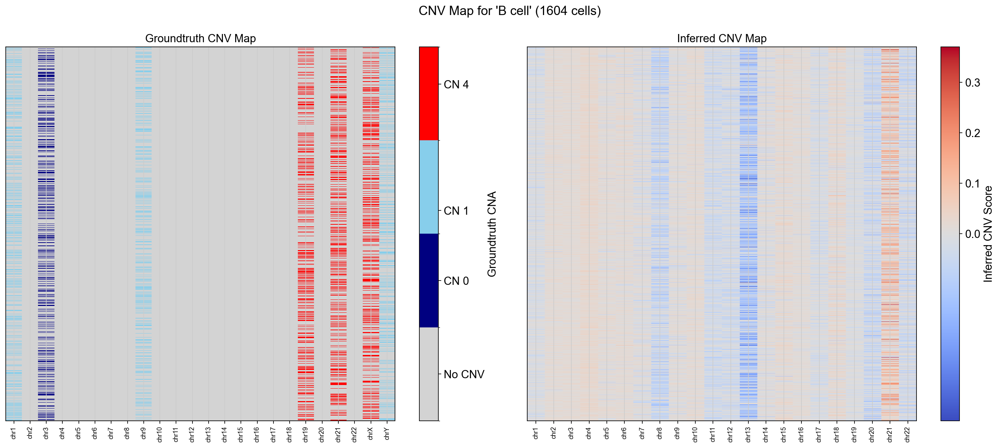

In [44]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    adata3,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

[INFO] Gain threshold: > 0.2854
[INFO] Loss threshold: < -0.2854
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


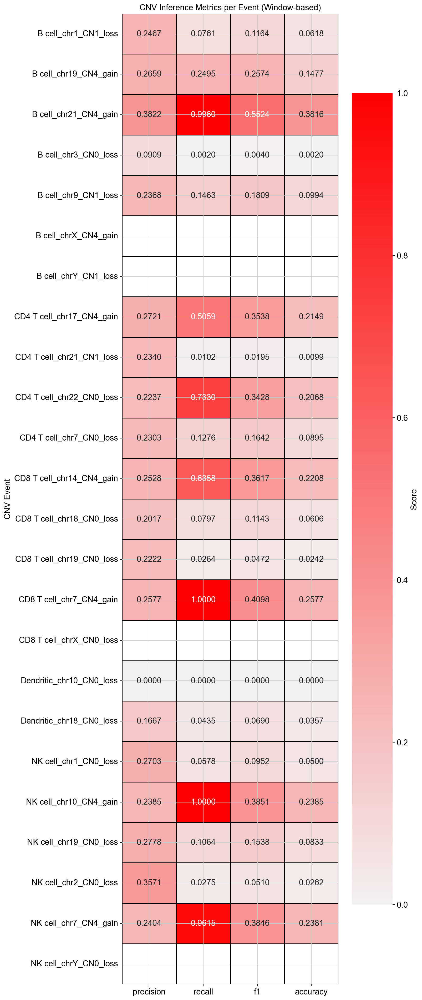

[INFO] Total predicted CNVs: 12191


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss   37.0   113.0   449.0   0.246667   
 1       B cell      chr19  4        gain  117.0   323.0   352.0   0.265909   
 2       B cell      chr21  4        gain  498.0   805.0     2.0   0.382195   
 3       B cell       chr3  0        loss    1.0    10.0   487.0   0.090909   
 4       B cell       chr9  1        loss   72.0   232.0   420.0   0.236842   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  561.0  1501.0   548.0   0.272066   
 8   CD4 T cell      chr21  1        loss   11.0    36.0  1068.0   0.234043   
 9   CD4 T cell      chr22  0        loss  774.0  2686.0   282.0   0.223699   
 10  CD4 T cell       chr7  0        loss  140.0   468.0   957.0   0.230263   
 11  CD8 T cell      chr14  4        gain  206.0   6

In [45]:
wcnv.evaluate_cnv_with_window(adata3, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.3866
[INFO] Loss threshold: < -0.3880
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


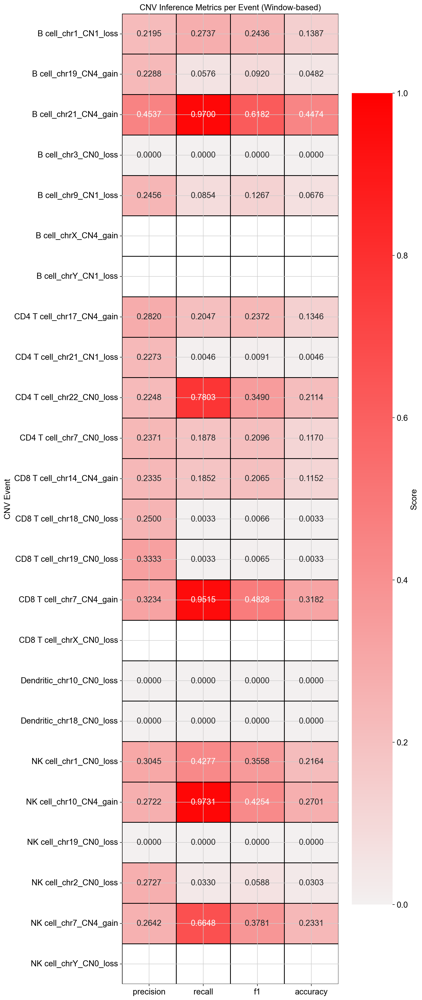

[INFO] Total predicted CNVs: 9889


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss  133.0   473.0   353.0   0.219472   
 1       B cell      chr19  4        gain   27.0    91.0   442.0   0.228814   
 2       B cell      chr21  4        gain  485.0   584.0    15.0   0.453695   
 3       B cell       chr3  0        loss    0.0     1.0   488.0   0.000000   
 4       B cell       chr9  1        loss   42.0   129.0   450.0   0.245614   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  227.0   578.0   882.0   0.281988   
 8   CD4 T cell      chr21  1        loss    5.0    17.0  1074.0   0.227273   
 9   CD4 T cell      chr22  0        loss  824.0  2842.0   232.0   0.224768   
 10  CD4 T cell       chr7  0        loss  206.0   663.0   891.0   0.237054   
 11  CD8 T cell      chr14  4        gain   60.0   1

In [46]:
wcnv.evaluate_cnv_with_window(adata3, gain_percentile=10, loss_percentile=10)

Reducing window distance from 5e6 to 1e6:

* The **30% threshold** captures more true CNV events (higher recall) with **moderate precision**. It balances sensitivity and specificity well, especially for broad events like chr21 gains in B cells (recall ≈ 99.6%, f1 ≈ 0.55).

* The **10% threshold** is too strict. It drastically reduces false positives, but also loses many true positives (e.g., chr3 loss in B cells: TP = 0, FN = 488), resulting in **poor recall** and **low overall f1 scores**.

When both using a 30% gain/loss percentile threshold, reducing the smoothing window from 5 Mb to 1 Mb increased the number of predicted CNVs (from \~6744 to \~12,191), and led to improved recall in many cases (e.g., CD4 T cell chr22 loss: recall ↑ from 0.588 to 0.733) due to better sensitivity to focal CNVs. However, this came with a moderate increase in false positives, slightly reducing precision in some events.

Overall, it seems that the 1 Mb window yielded **higher recall and comparable F1 scores**, making it preferable when detecting shorter or more localized CNVs is important. The 5 Mb window remains useful if robustness to noise and fewer false positives are prioritized.

Here, I use **5 Mb window + 30% thresholds** for CNV annotation as an example.

In [47]:
wcnv.assign_cnas_to_cells_parallel(adata2, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.1862
[INFO] Loss threshold: < -0.1714
Assigning CNAs using all cores...


Parallel CNA assignment: 100%|██████████| 10373/10373 [00:01<00:00, 6520.66it/s]


In [48]:
adata2.obs['called_cnas']

AAACCCAAGCGCCCAT-1    [(chr2, 1734690, 1739557, loss), (chr2, 218179...
AAACCCACAGAGTTGG-1    [(chr2, 1785285, 1892292, gain), (chr2, 191759...
AAACCCACAGGTATGG-1    [(chr2, 3630767, 3652761, loss), (chr2, 390018...
AAACCCACATAGTCAC-1    [(chr1, 1308597, 1311677, loss), (chr3, 923477...
AAACCCACATCCAATG-1    [(chr1, 1173056, 1179555, gain), (chr2, 170237...
                                            ...                        
TTTGTTGGTGCGTCGT-1    [(chr1, 1280436, 1292029, gain), (chr2, 163522...
TTTGTTGGTGTCATGT-1    [(chr2, 3625015, 3630127, loss), (chr2, 365251...
TTTGTTGGTTTGAACC-1    [(chr1, 1081818, 1116361, gain), (chr2, 170237...
TTTGTTGTCCAAGCCG-1    [(chr1, 1173056, 1179555, gain), (chr2, 163522...
TTTGTTGTCTTACTGT-1    [(chr1, 1242446, 1246722, gain), (chr2, 173469...
Name: called_cnas, Length: 10373, dtype: object

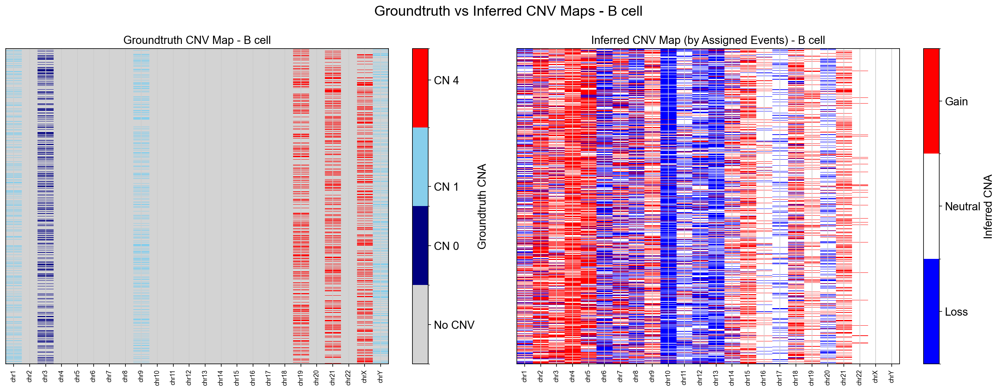

In [50]:
wcnv.plot_groundtruth_and_inferred_cnv(
    adata2,
    cell_type='B cell',
)

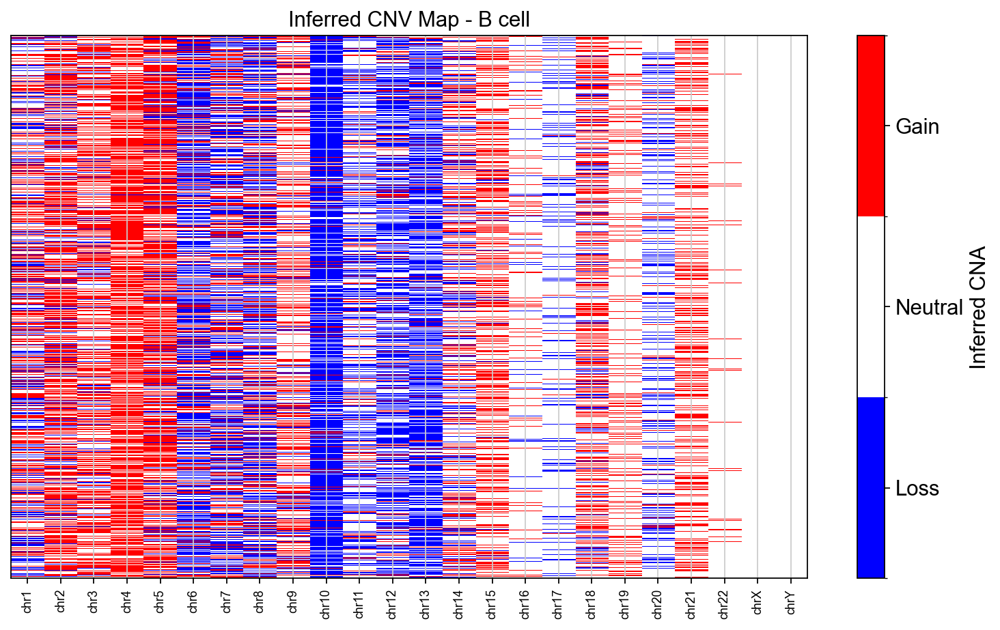

In [49]:
wcnv.plot_inferred_cnv_map(adata2, cell_type="B cell")

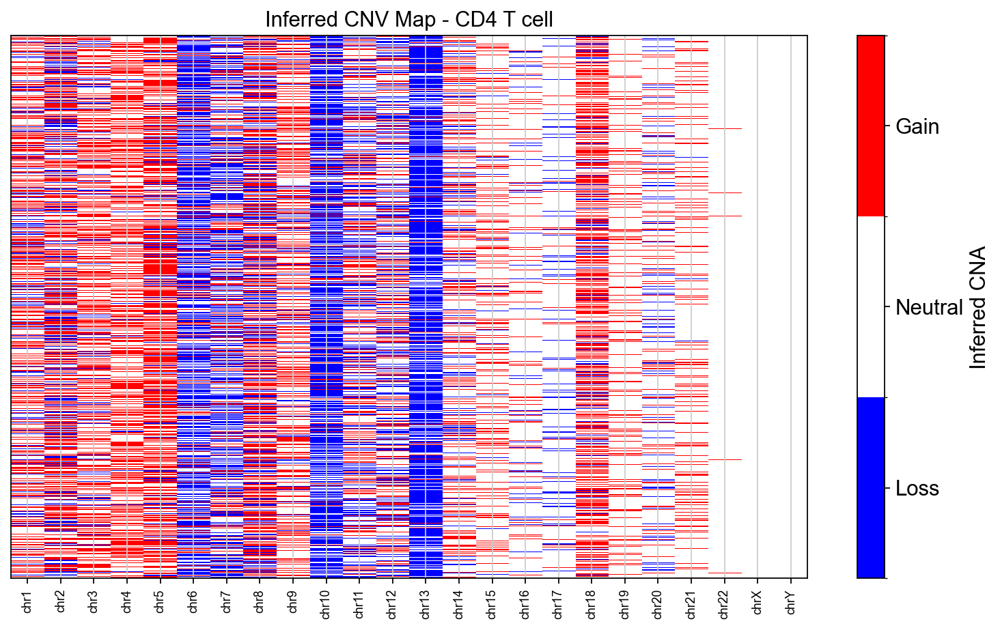

In [51]:
wcnv.plot_inferred_cnv_map(adata2, cell_type="CD4 T cell")

However, a key limitation remains: the method still infers too many CNV events overall, indicating a tendency toward overcalling. This is an area that will require refinement in future iterations to improve specificity and reduce false positives.

## Read Depth Impact

Unlike in Task 2A, here we are able to start from the original gene expression data, perform downsampling first, and then simulate CNVs, allowing for more controlled and realistic evaluation.

In [52]:
# Get the raw count matrix
X_counts = adata_save.layers['counts']
if hasattr(X_counts, "toarray"):  # handle sparse matrix
    X_counts = X_counts.toarray()

# Compute total read depth per cell
read_depth = X_counts.sum(axis=1)
adata_save.obs['read_depth'] = read_depth

# Summary statistics
print(adata_save.obs['read_depth'].describe())

count    10373.000000
mean      6958.744629
std       3365.915527
min        640.000000
25%       4697.000000
50%       6020.000000
75%       8575.000000
max      26658.000000
Name: read_depth, dtype: float64


In [53]:
# Restore raw counts
adata_save.X = adata_save.layers['counts'].copy()

In [54]:
ad_down = adata_save.copy()
ad_down.X = ad_down.layers['counts'].copy()
sc.pp.downsample_counts(ad_down, counts_per_cell=3000)

In [55]:
# Sum counts per cell after downsampling
if hasattr(ad_down.X, "toarray"):  # If sparse
    counts = ad_down.X.toarray()
else:
    counts = ad_down.X

total_counts = counts.sum(axis=1)
ad_down.obs['post_downsample_depth'] = total_counts

# Check if all cells have exactly the expected depth
print(ad_down.obs['post_downsample_depth'].describe())
print("\nUnique total counts (should be one value):")
print(np.unique(total_counts))

count    10373.000000
mean      2959.787598
std        225.846207
min        640.000000
25%       3000.000000
50%       3000.000000
75%       3000.000000
max       3000.000000
Name: post_downsample_depth, dtype: float64

Unique total counts (should be one value):
[ 640.  737.  765.  771.  792.  803.  805.  810.  813.  843.  850.  855.
  863.  891.  894.  907.  915.  930.  941.  951.  954.  956.  989. 1004.
 1023. 1042. 1045. 1053. 1062. 1070. 1071. 1073. 1079. 1082. 1083. 1091.
 1093. 1094. 1098. 1104. 1116. 1127. 1140. 1142. 1162. 1169. 1172. 1178.
 1190. 1191. 1197. 1198. 1226. 1232. 1235. 1239. 1248. 1253. 1255. 1265.
 1276. 1283. 1285. 1300. 1302. 1306. 1307. 1308. 1311. 1317. 1330. 1342.
 1354. 1357. 1361. 1367. 1371. 1377. 1383. 1394. 1402. 1426. 1431. 1433.
 1435. 1447. 1455. 1470. 1485. 1486. 1511. 1513. 1518. 1530. 1532. 1533.
 1544. 1561. 1573. 1574. 1589. 1597. 1603. 1605. 1606. 1607. 1608. 1610.
 1622. 1626. 1631. 1632. 1635. 1637. 1642. 1657. 1658. 1664. 1670. 1685.
 1686.

In [56]:
ad_sim = wcnv.simulate_cnas_by_celltype(ad_down, celltype_col='cell_type', celltype_cna_counts=celltype_cna_counts)


[Simulated CNV Summary]
     cell_type chromosome  CN  num_events  avg_size_bp
0       B cell          1   1         486    8782233.0
1       B cell         19   4         469     561379.0
2       B cell         21   4         500   40704395.0
3       B cell          3   0         488     997978.0
4       B cell          9   1         492    6442748.0
5       B cell          X   4         480     609515.0
6       B cell          Y   1         465    9644360.0
7   CD4 T cell         17   4        1109    6869209.0
8   CD4 T cell         21   1        1079     557171.0
9   CD4 T cell         22   0        1056     815663.0
10  CD4 T cell          7   0        1097    5172732.0
11  CD8 T cell         14   4         324     666165.0
12  CD8 T cell         18   0         301    8165648.0
13  CD8 T cell         19   0         303     835271.0
14  CD8 T cell          7   4         309   48501532.0
15  CD8 T cell          X   0         303    4634486.0
16   Dendritic         10   0          2

The same CNV events are simulated across runs—utilizing a fixed random seed set implicitly in the code (with the option for user-defined input)—to ensure reproducibility and enable fair comparison.

In [57]:
# filter based on total number of genes detected (at least 500).
sc.pp.filter_cells(ad_down, min_genes=500)
# filter based on total number of counts (fewer than than 30,000).
sc.pp.filter_cells(ad_down, max_counts=30000)
# keep genes that are detected in at least 3 cells.
sc.pp.filter_genes(ad_down, min_cells=3)

In [58]:
ad_down.layers['counts'] = ad_down.X.copy()
sc.pp.normalize_total(ad_down, target_sum=1e4)
sc.pp.log1p(ad_down)
ad_down.layers['lognorm'] = ad_down.X.copy()

sc.pp.highly_variable_genes(ad_down, min_mean=0.0125, max_mean=6, min_disp=0.25)

In [59]:
sc.tl.pca(ad_down , mask_var='highly_variable')

n_neighbors = 20
n_pcs = 10
# Compute the k-nearest neighbor graph using specified number of neighbors and principal components
sc.pp.neighbors(ad_down, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Perform Leiden clustering with the specified resolution
sc.tl.leiden(ad_down, .1)

# Compute the PAGA for trajectory inference
sc.tl.paga(ad_down)
sc.pl.paga(ad_down, plot=False)

# Compute the UMAP for 2D visualization using PAGA initialization
sc.tl.umap(ad_down, 0.25, init_pos='paga')

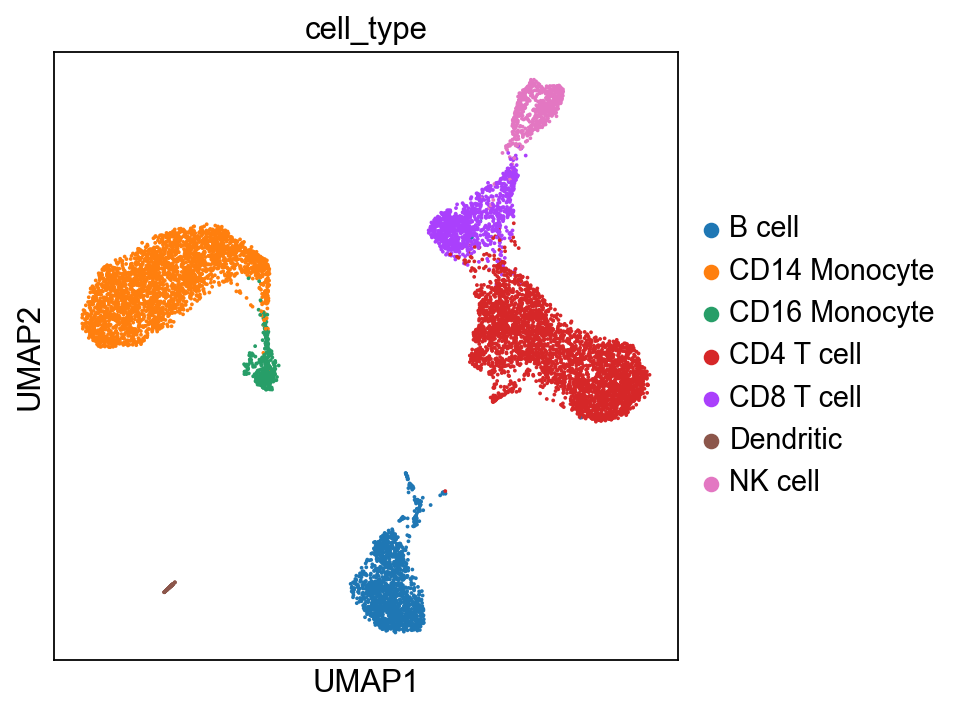

In [60]:
sc.pl.umap(ad_down, color="cell_type")

In [61]:
wcnv.find_reference_candidates(ad_down)


Top 5 lowest-variance cell types:

CD4 T cell: avg variance = 0.1238
B cell: avg variance = 0.1295
CD8 T cell: avg variance = 0.1374
CD16 Monocyte: avg variance = 0.1428
CD14 Monocyte: avg variance = 0.1439


['CD4 T cell', 'B cell', 'CD8 T cell', 'CD16 Monocyte', 'CD14 Monocyte']

Now, the recommended normal cell type shifts from CD16 Monocyte to CD4 T cell, as CD16 Monocyte exhibits relatively higher variation. This is somewhat unexpected, given that CNVs were simulated in CD4 T cells—not CD16 Monocytes—raising concerns about the original data. Even after downsampling, it suggests that certain cell types, like CD16 Monocytes, may inherently exhibit higher gene expression variability.

In [62]:
ad_down1=ad_down.copy()

In [63]:
wcnv.infercnv(
    adata=ad_down1,
    reference_key="cell_type",
    reference_cat="CD4 T cell",
    smooth=True,
    window_distance=5e6,
    normalization_mode="reference",
    inplace=True,
    key_added="cnv"
)

Running inferCNV chunks: 100%|████████████████████| 3/3 [00:00<00:00,  4.22it/s]


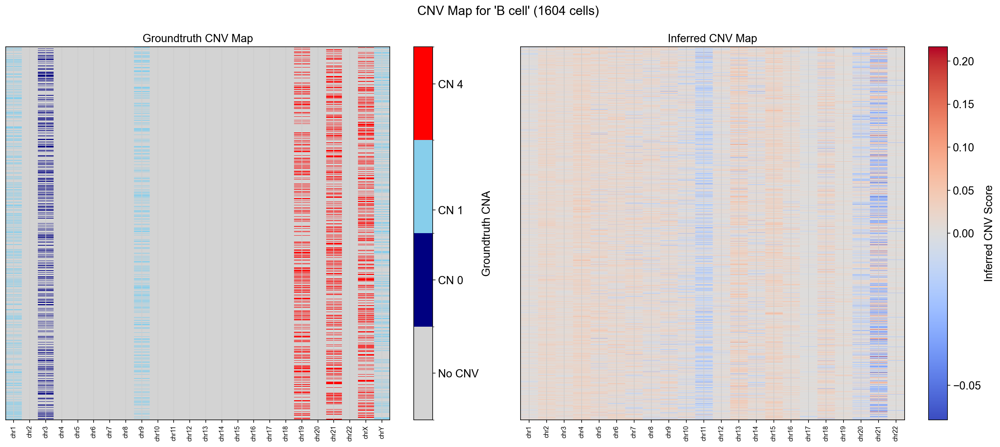

In [64]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    ad_down1,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

[INFO] Gain threshold: > 0.2283
[INFO] Loss threshold: < -0.1837
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


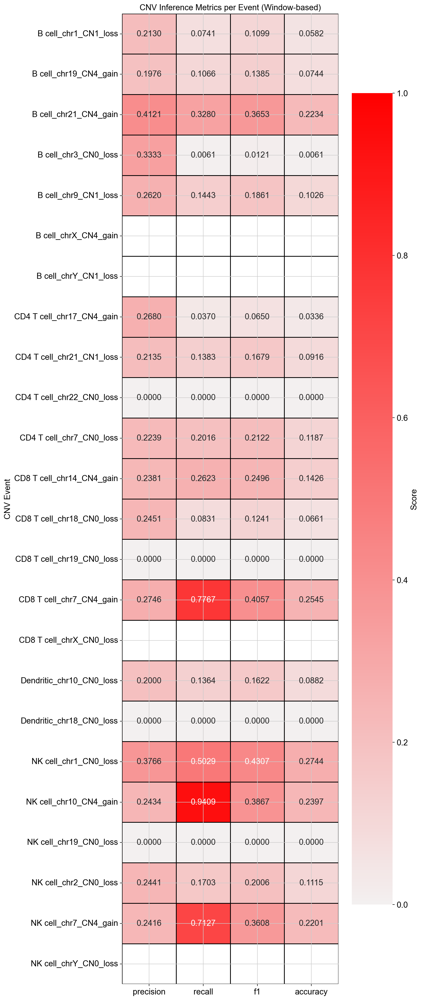

[INFO] Total predicted CNVs: 5901


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss   36.0  133.0   450.0   0.213018   
 1       B cell      chr19  4        gain   50.0  203.0   419.0   0.197628   
 2       B cell      chr21  4        gain  164.0  234.0   336.0   0.412060   
 3       B cell       chr3  0        loss    3.0    6.0   485.0   0.333333   
 4       B cell       chr9  1        loss   71.0  200.0   421.0   0.261993   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain   41.0  112.0  1068.0   0.267974   
 8   CD4 T cell      chr21  1        loss  149.0  549.0   928.0   0.213467   
 9   CD4 T cell      chr22  0        loss    0.0    0.0  1055.0   0.000000   
 10  CD4 T cell       chr7  0        loss  221.0  766.0   875.0   0.223911   
 11  CD8 T cell      chr14  4        gain   85.0  272.0   239.0 

In [65]:
wcnv.evaluate_cnv_with_window(ad_down1, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.3094
[INFO] Loss threshold: < -0.2301
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


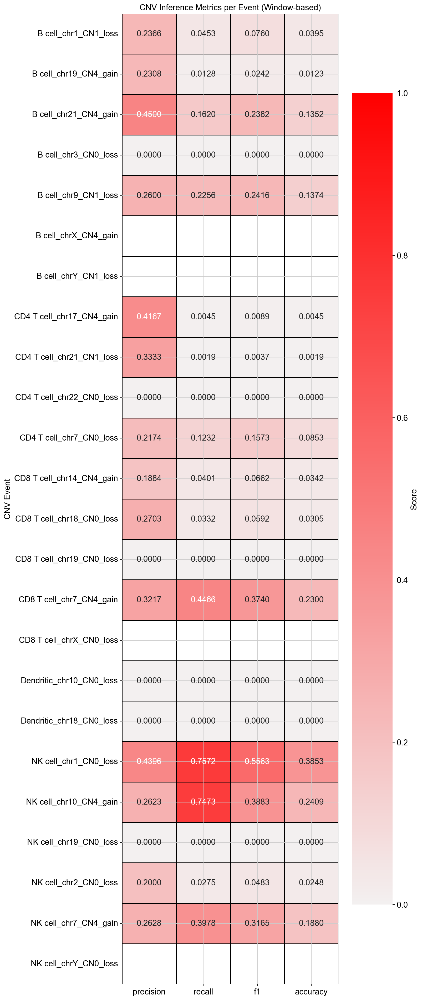

[INFO] Total predicted CNVs: 3030


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss   22.0   71.0   464.0   0.236559   
 1       B cell      chr19  4        gain    6.0   20.0   463.0   0.230769   
 2       B cell      chr21  4        gain   81.0   99.0   419.0   0.450000   
 3       B cell       chr3  0        loss    0.0    1.0   488.0   0.000000   
 4       B cell       chr9  1        loss  111.0  316.0   381.0   0.259953   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain    5.0    7.0  1104.0   0.416667   
 8   CD4 T cell      chr21  1        loss    2.0    4.0  1075.0   0.333333   
 9   CD4 T cell      chr22  0        loss    0.0    0.0  1055.0   0.000000   
 10  CD4 T cell       chr7  0        loss  135.0  486.0   961.0   0.217391   
 11  CD8 T cell      chr14  4        gain   13.0   56.0   311.0 

In [66]:
wcnv.evaluate_cnv_with_window(ad_down1, gain_percentile=10, loss_percentile=10)

[INFO] Gain threshold: > 0.1904
[INFO] Loss threshold: < -0.1648
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


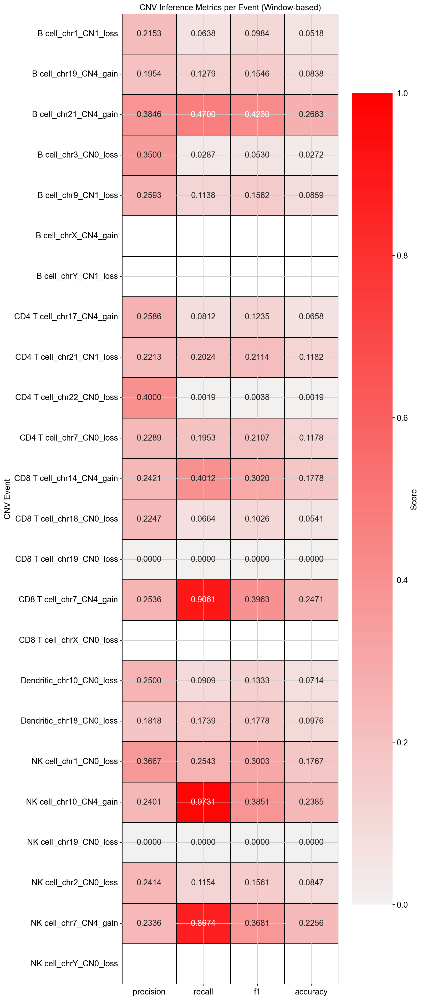

[INFO] Total predicted CNVs: 6984


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss   31.0  113.0   455.0   0.215278   
 1       B cell      chr19  4        gain   60.0  247.0   409.0   0.195440   
 2       B cell      chr21  4        gain  235.0  376.0   265.0   0.384615   
 3       B cell       chr3  0        loss   14.0   26.0   474.0   0.350000   
 4       B cell       chr9  1        loss   56.0  160.0   436.0   0.259259   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain   90.0  258.0  1019.0   0.258621   
 8   CD4 T cell      chr21  1        loss  218.0  767.0   859.0   0.221320   
 9   CD4 T cell      chr22  0        loss    2.0    3.0  1053.0   0.400000   
 10  CD4 T cell       chr7  0        loss  214.0  721.0   882.0   0.228877   
 11  CD8 T cell      chr14  4        gain  130.0  407.0   194.0 

In [67]:
wcnv.evaluate_cnv_with_window(ad_down1, gain_percentile=50, loss_percentile=50)

Among the three tested percentile thresholds, the **30% threshold provides the most balanced and reliable performance**. At the 10% cutoff, the method is highly conservative: it predicts fewer CNVs overall, resulting in low recall and poor sensitivity to true events. Although precision is somewhat preserved, many true CNV regions go undetected, making this threshold unsuitable when the goal is comprehensive event detection.

On the other end, the 50% threshold is more liberal, yielding the highest number of predicted CNVs and improving recall. However, this comes at the expense of precision, as many of the predicted events are false positives. The result is a noisier CNV map that may obscure biologically meaningful patterns or inflate downstream analyses.

Additionally, comparing the 30% threshold results **before** and **after reducing read depth** reveals a clear trade-off introduced by lower sequencing coverage.

Before read depth reduction, using a 30% gain/loss percentile resulted in **6,744 total predicted CNVs**, with stronger overall recall across many events. Several CNVs—such as *CD8 T cell chr7 gain* and *B cell chr21 gain*—achieved high F1 scores (0.49 and 0.62, respectively), with the latter reaching **92.8% recall**, indicating strong sensitivity. However, this came at the cost of moderate to high false positives, reflected in lower precision values (e.g., \~0.25–0.47 for the top-performing events).

After reducing read depth, while still applying the 30% threshold, the **total predicted CNVs decreased to 5,901**, and recall dropped noticeably. For example, the *CD8 T cell chr7 gain* F1 score fell from **0.49 to 0.41**, and *B cell chr21 gain* dropped from **0.62 to 0.37**. Precision remained similar or slightly improved in some cases (due to fewer predictions), but the reduction in recall suggests that many true events were missed, likely due to weakened signal strength from fewer reads.

In summary, our function yields better performance **before reducing read depth**, offering higher sensitivity and more balanced F1 scores. Lower read depth weakens detection ability—particularly recall—despite slightly mitigating overcalling in noisier regions.

In [68]:
ad_down2=ad_down.copy()

In [69]:
wcnv.infercnv(
    adata=ad_down2,
    reference_key="cell_type",
    reference_cat="CD4 T cell",
    smooth=True,
    window_distance=1e6,
    normalization_mode="reference",
    inplace=True,
    key_added="cnv"
)

Running inferCNV chunks: 100%|████████████████████| 3/3 [00:00<00:00,  3.61it/s]


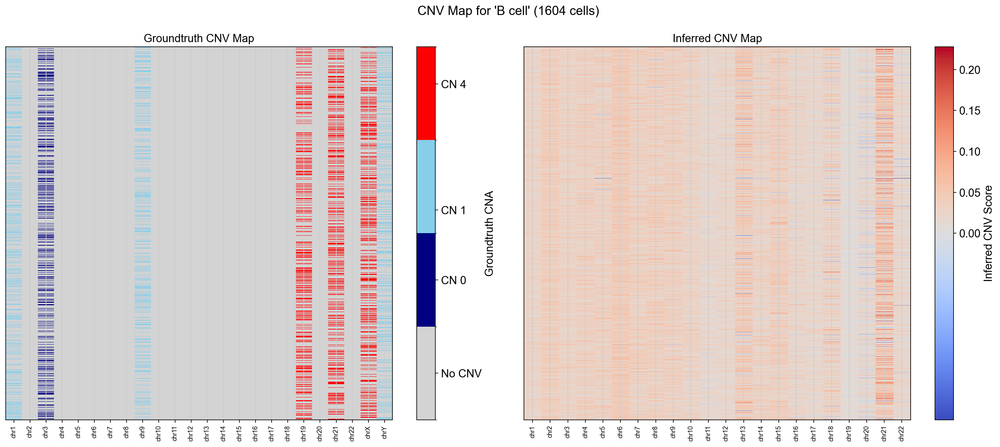

In [70]:
wcnv.plot_cnv_groundtruth_vs_inferred(
    ad_down2,
    cell_type='B cell',
    cnv_truth_key='simulated_cnvs',
    cnv_inferred_key='cnv'
)

[INFO] Gain threshold: > 0.3406
[INFO] Loss threshold: < -0.2774
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


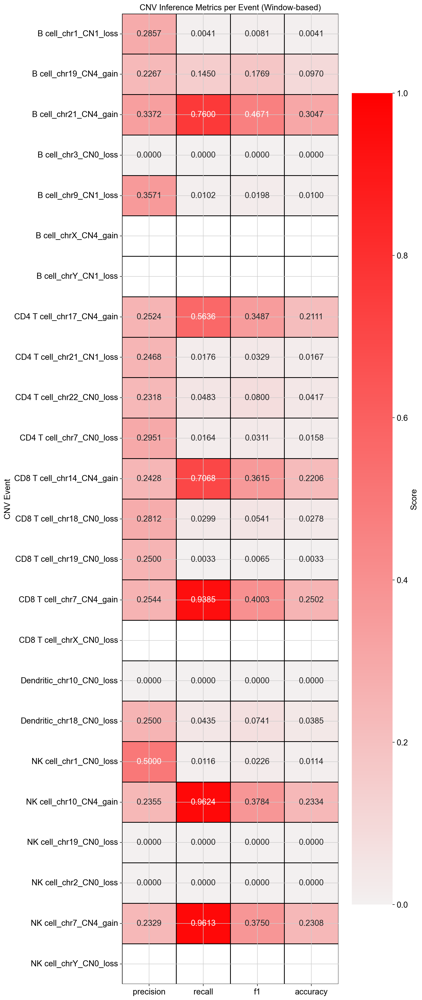

[INFO] Total predicted CNVs: 7920


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss    2.0     5.0   484.0   0.285714   
 1       B cell      chr19  4        gain   68.0   232.0   401.0   0.226667   
 2       B cell      chr21  4        gain  380.0   747.0   120.0   0.337178   
 3       B cell       chr3  0        loss    0.0     4.0   488.0   0.000000   
 4       B cell       chr9  1        loss    5.0     9.0   487.0   0.357143   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  625.0  1851.0   484.0   0.252423   
 8   CD4 T cell      chr21  1        loss   19.0    58.0  1058.0   0.246753   
 9   CD4 T cell      chr22  0        loss   51.0   169.0  1004.0   0.231818   
 10  CD4 T cell       chr7  0        loss   18.0    43.0  1078.0   0.295082   
 11  CD8 T cell      chr14  4        gain  229.0   7

In [71]:
wcnv.evaluate_cnv_with_window(ad_down2, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.4724
[INFO] Loss threshold: < -0.4003
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


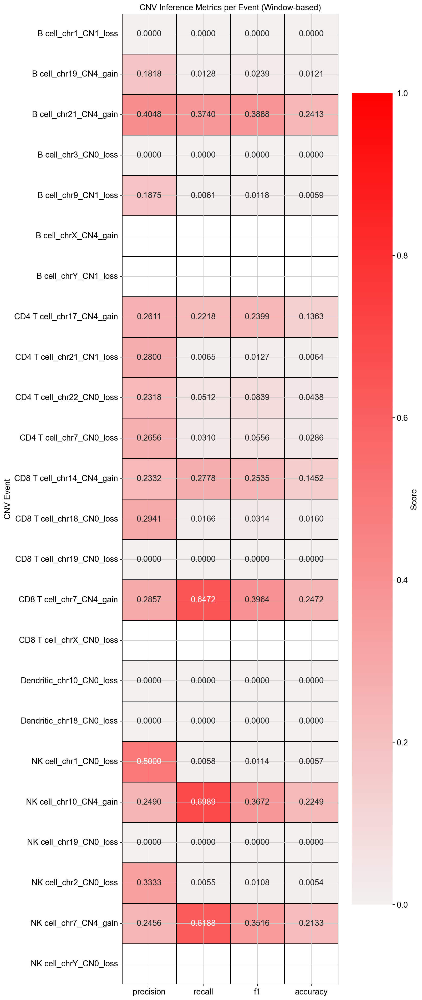

[INFO] Total predicted CNVs: 3926


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss    0.0    0.0   486.0   0.000000   
 1       B cell      chr19  4        gain    6.0   27.0   463.0   0.181818   
 2       B cell      chr21  4        gain  187.0  275.0   313.0   0.404762   
 3       B cell       chr3  0        loss    0.0    1.0   488.0   0.000000   
 4       B cell       chr9  1        loss    3.0   13.0   489.0   0.187500   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  246.0  696.0   863.0   0.261146   
 8   CD4 T cell      chr21  1        loss    7.0   18.0  1070.0   0.280000   
 9   CD4 T cell      chr22  0        loss   54.0  179.0  1001.0   0.231760   
 10  CD4 T cell       chr7  0        loss   34.0   94.0  1062.0   0.265625   
 11  CD8 T cell      chr14  4        gain   90.0  296.0   234.0 

In [72]:
wcnv.evaluate_cnv_with_window(ad_down2, gain_percentile=10, loss_percentile=10)

[INFO] Gain threshold: > 0.2805
[INFO] Loss threshold: < -0.2483
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


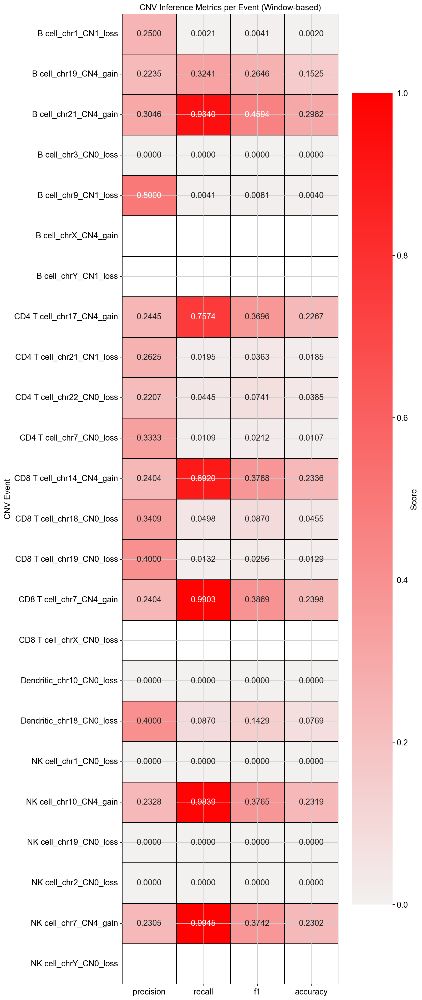

[INFO] Total predicted CNVs: 10088


(     cell_type chromosome CN groundtruth     TP      FP      FN  precision  \
 0       B cell       chr1  1        loss    1.0     3.0   485.0   0.250000   
 1       B cell      chr19  4        gain  152.0   528.0   317.0   0.223529   
 2       B cell      chr21  4        gain  467.0  1066.0    33.0   0.304631   
 3       B cell       chr3  0        loss    0.0     0.0   488.0   0.000000   
 4       B cell       chr9  1        loss    2.0     2.0   490.0   0.500000   
 5       B cell       chrX  4        gain    NaN     NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN     NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  840.0  2596.0   269.0   0.244470   
 8   CD4 T cell      chr21  1        loss   21.0    59.0  1056.0   0.262500   
 9   CD4 T cell      chr22  0        loss   47.0   166.0  1008.0   0.220657   
 10  CD4 T cell       chr7  0        loss   12.0    24.0  1084.0   0.333333   
 11  CD8 T cell      chr14  4        gain  289.0   9

In [73]:
wcnv.evaluate_cnv_with_window(ad_down2, gain_percentile=50, loss_percentile=50)

With a reduced window distance of 1 Mb, using a 30% percentile threshold leads to greater sensitivity, detecting more true CNVs and achieving higher recall across many events. However, this comes with increased false positives and slightly lower precision. In contrast, the 10% threshold produces fewer predictions with cleaner precision but at the cost of significantly reduced recall—many true CNVs are missed entirely. Overall, the **30% threshold provides a better trade-off** under this window setting by retaining detection power despite some added noise.

Comparing the **1 Mb and 5 Mb window distances after read depth reduction**, the 1 Mb window (with 30% thresholds) generally shows higher recall, meaning it is more sensitive in detecting true CNVs, especially for large-scale gains and losses like those on chr21 or chr7. However, this sensitivity comes at the cost of a higher number of false positives, reducing precision slightly. In contrast, the 5 Mb window with the same thresholds is more conservative—it yields fewer total CNV calls and exhibits slightly better precision in some cases, but recall suffers, with many true events either partially detected or missed.

Overall, for data with **reduced read depth**, using a **smaller window size (1 Mb) with 30% gain/loss thresholds** offers a better balance between detection sensitivity and acceptable precision. In contrast, a 5 Mb window becomes too coarse to effectively capture focal CNV signals under low coverage conditions.

**Compared to the baseline configuration before read depth reduction (5 Mb window, 30% thresholds), all reduced-depth settings show performance trade-offs that are influenced by both window size and percentile thresholds.**

In the original dataset, CNV detection was more stable: the total number of CNV calls was moderate (\~6,700), recall was high for strong signals (e.g., chr21 gain in B cells), and false positives were reasonably controlled, yielding strong F1 scores (e.g., 0.62). After reducing read depth, restoring the 5 Mb window size maintains somewhat better precision, but sensitivity drops notably, particularly for narrower events.

Switching to a 1 Mb window under reduced depth recovers many of these missed focal CNVs, leading to much higher recall (often >95% for B cell chr21 gain or NK cell chr7 gain). However, this improvement comes at the cost of increased fragmentation and a surge in false positives, inflating total CNV calls (up to \~12,000) and reducing precision and overall interpretability—especially in complex or noisy regions like CD4 chr22.

In conclusion, for the original read depth, the default setting (**5 Mb, 30%**) offers the most robust and interpretable results. Under **reduced read depth**, adjusting the window to **1 Mb can help recover sensitivity**, but it introduces noise.

Here, I use 1 Mb window with 30% thresholds as an example for annotation.

In [74]:
wcnv.assign_cnas_to_cells_parallel(ad_down2, gain_percentile=30, loss_percentile=30)

[INFO] Gain threshold: > 0.3406
[INFO] Loss threshold: < -0.2774
Assigning CNAs using all cores...


Parallel CNA assignment: 100%|██████████| 10362/10362 [00:04<00:00, 2412.36it/s]


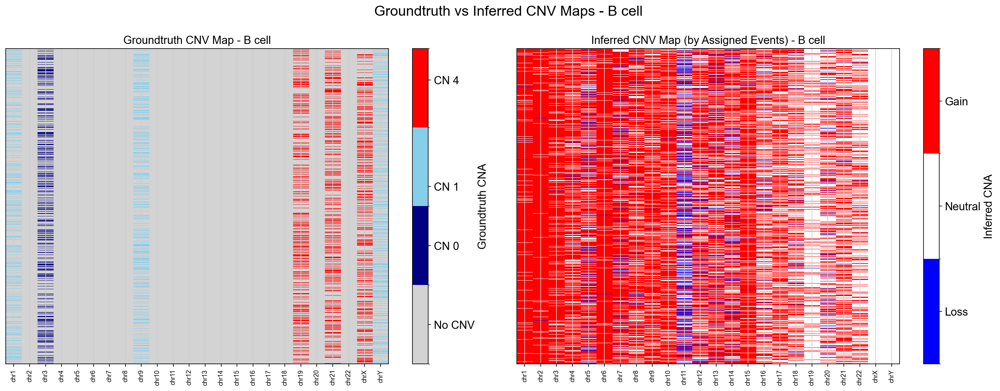

In [76]:
wcnv.plot_groundtruth_and_inferred_cnv(
    ad_down2,
    cell_type='B cell'
)

Since we observed that the function tends to infer more gains than losses, we can try different thresholds to potentially balance the detection of both event types.

In [77]:
ad_down3 = ad_down2.copy()

In [78]:
wcnv.assign_cnas_to_cells_parallel(ad_down3, gain_percentile=10, loss_percentile=30)

[INFO] Gain threshold: > 0.4724
[INFO] Loss threshold: < -0.2774
Assigning CNAs using all cores...


Parallel CNA assignment: 100%|██████████| 10362/10362 [00:01<00:00, 8926.52it/s]


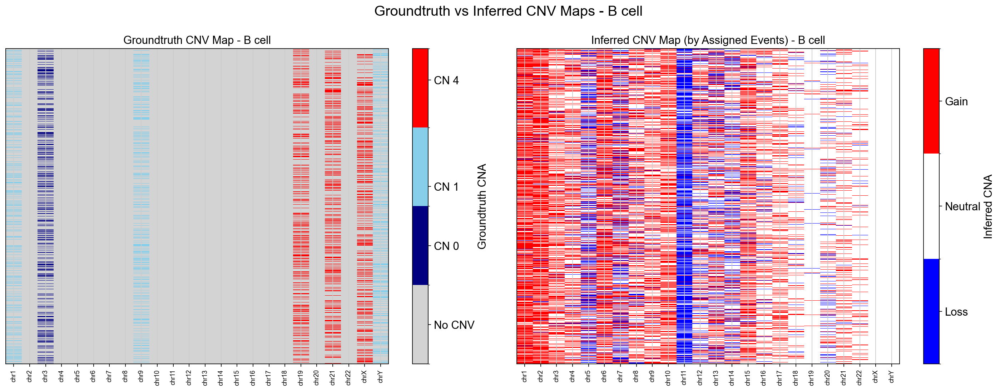

In [79]:
wcnv.plot_groundtruth_and_inferred_cnv(
    ad_down3,
    cell_type='B cell'
)

[INFO] Gain threshold: > 0.4724
[INFO] Loss threshold: < -0.2774
Excluded GT CNV event due to missing chromosome: ('NK cell', 'chrY', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('CD8 T cell', 'chrX', 0, 'loss')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrX', 4, 'gain')
Excluded GT CNV event due to missing chromosome: ('B cell', 'chrY', 1, 'loss')


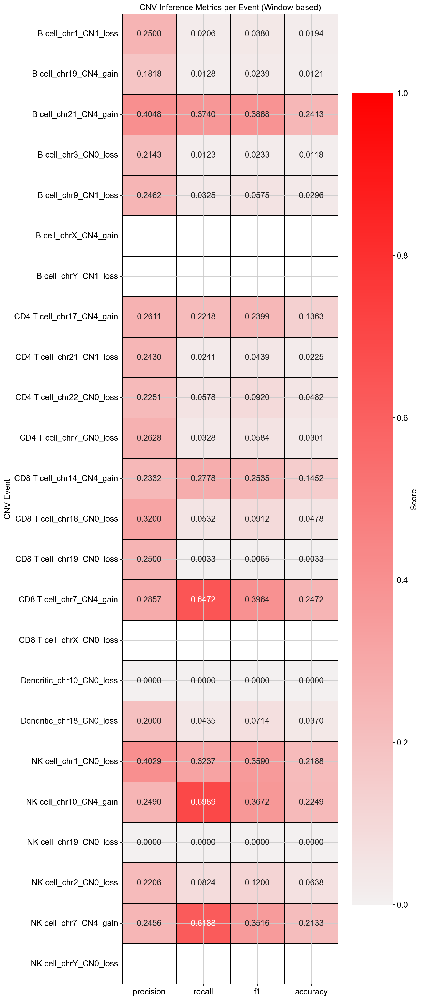

[INFO] Total predicted CNVs: 4416


(     cell_type chromosome CN groundtruth     TP     FP      FN  precision  \
 0       B cell       chr1  1        loss   10.0   30.0   476.0   0.250000   
 1       B cell      chr19  4        gain    6.0   27.0   463.0   0.181818   
 2       B cell      chr21  4        gain  187.0  275.0   313.0   0.404762   
 3       B cell       chr3  0        loss    6.0   22.0   482.0   0.214286   
 4       B cell       chr9  1        loss   16.0   49.0   476.0   0.246154   
 5       B cell       chrX  4        gain    NaN    NaN     NaN        NaN   
 6       B cell       chrY  1        loss    NaN    NaN     NaN        NaN   
 7   CD4 T cell      chr17  4        gain  246.0  696.0   863.0   0.261146   
 8   CD4 T cell      chr21  1        loss   26.0   81.0  1051.0   0.242991   
 9   CD4 T cell      chr22  0        loss   61.0  210.0   994.0   0.225092   
 10  CD4 T cell       chr7  0        loss   36.0  101.0  1060.0   0.262774   
 11  CD8 T cell      chr14  4        gain   90.0  296.0   234.0 

In [80]:
wcnv.evaluate_cnv_with_window(ad_down3, gain_percentile=10, loss_percentile=30)

The metrics indicate a much lower false positive rate compared to using the 30% percentile threshold for both gains and losses, but smaller or weaker CNVs remain underdetected. Moreover, it's still clear that reducing read depth diminishes overall inference accuracy.